In [73]:
import json
import pprint
%matplotlib inline  
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import os

# metrics plot

In [4]:
def make_json_list(jsonpath):
    json_list = []
    with open(jsonpath, 'r') as j:
        for line in j:
            js = json.loads(line)            
            json_list.append(js)
    return json_list

In [61]:
def merge_json(jsonpath):
    """
    Since 0306, the json result of experiment is written for each game_count, noise, hparams.
    we need to gather them and merge to make json files like before 0306.    
    """
    
    json_list = make_json_list(jsonpath)
    metrics = ["f1", "roc_auc", "crossentropy", "dcg", "ndcg", "game_score", "threshold", "is_hacky_clue"]
    teams = ["RED", "BLUE"]
    new_json_list = []
    
    for i, a_json in enumerate(json_list):
        alpha = a_json['hparams_alpha']
        delta = a_json['hparams_delta']
        noise = a_json['hparams_noise']
        game_count = a_json['game_count']

        if game_count > 1:
            continue
        del a_json['game_count']
        
        new_json_list.append(a_json) # new_json_list[i] = a_json

        for candidate_json in json_list[i+1:]:
            same_cond = (candidate_json['hparams_alpha'] == alpha and
                        candidate_json['hparams_delta'] == delta and
                        candidate_json['hparams_noise'] == noise)
            if same_cond:
                for team in teams:
                    for metric in metrics:
                        new_json_list[i][team][metric].extend(candidate_json[team][metric])
    return new_json_list

In [76]:
def plot_one_team_metric_for_two_hparam(team, jsonpath, x_axis, y_axis, fix_other, savefig, basedir):
    """
    make sure you use either merge_json or make_json_list
    """
    metrics = ["f1", "roc_auc", "crossentropy", "dcg", "ndcg", "game_score", "is_hacky_clue"]
    axis_list = ["alpha", "delta", "noise"]
    
    if x_axis not in axis_list or y_axis not in axis_list:
        raise ValueError("axis should be alpha, delta, noise")

    exclude_axis = "".join([axis_name for axis_name in axis_list if axis_name not in [x_axis, y_axis]])
    print("x_axis: ", x_axis)
    print("y_axis: ", y_axis)
    print("excluded axis: ", exclude_axis, "fixed at: ", fix_other)
    for ix, metric in enumerate(metrics):
        x_values = []
        y_values = []
        z_values = []
        json_list = merge_json(jsonpath)
        for a_json in json_list:

            a_json_team = a_json[team]
            x = a_json['hparams_{}'.format(x_axis)]
            y = a_json['hparams_{}'.format(y_axis)]
            other = a_json['hparams_{}'.format(exclude_axis)]

            if other != fix_other:
                continue
            
            x_values.append(x)
            y_values.append(y)
            z_ave_value = np.mean(np.array(a_json_team[metric]))
            
            ave_len = len(a_json_team[metric])
            z_values.append(z_ave_value)
        x_num = len(set(x_values))
        y_num = len(set(y_values))
        
        subplotstring = "61" + str(ix+1)
        
        plt.figure(figsize=(10, 5))
        plt.scatter(x_values, y_values, c=z_values, linewidths=10)
        plt.colorbar()
        plttitle = "{}/{}: ({} is fixed at {})".format(team, metric, exclude_axis, fix_other)
        plt.title(plttitle)
        plt.xlabel("{}".format(x_axis), fontsize=15)
        plt.ylabel("{}".format(y_axis), fontsize=15)

        if savefig:
            base_savedir = "../images/{}".format(basedir)
            metric_savedir = os.path.join(base_savedir, metric)
            fixed_savedir = "{}_fixed".format(exclude_axis)
            savedir = os.path.join(metric_savedir, fixed_savedir)
            
            filename = "{}.png".format(fix_other)
            
            if not os.path.exists(base_savedir):
                os.mkdir(base_savedir)
            if not os.path.exists(metric_savedir):
                os.mkdir(metric_savedir)
            if not os.path.exists(savedir):
                os.mkdir(savedir)
                
            savepath = os.path.join(savedir, filename)
            plt.savefig(savepath)

In [91]:
glove_normalized_alpha="../logs/03102018_1131_plot_d_n_a_glove_non_normalized_alpha/metrics.json"
glove_non_normalized_alpha="../logs/03102018_1131_plot_d_n_a_glove_non_normalized_alpha/metrics.json"
normalized_alpha="../logs/03102018_0531_plot_d_n_a_normalized_alpha/metrics.json"
non_normalized_alpha="../logs/03102018_0519_plot_d_n_a_non_normalized_alpha/metrics.json"

base_glove = "glove_normalize"
base_glove_non = "glove_non_normalize"
base = "normalize"
base_non = "non_normalize"

# x: alpha, y:delta, (noise=0.0)

x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.0


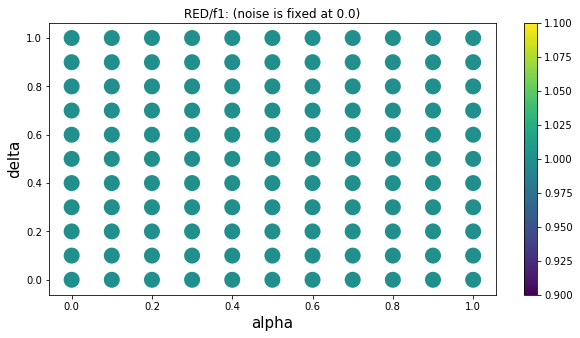

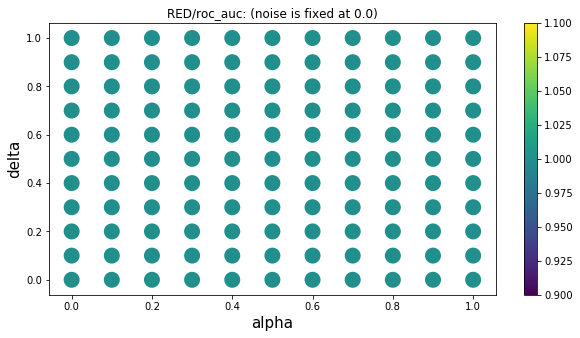

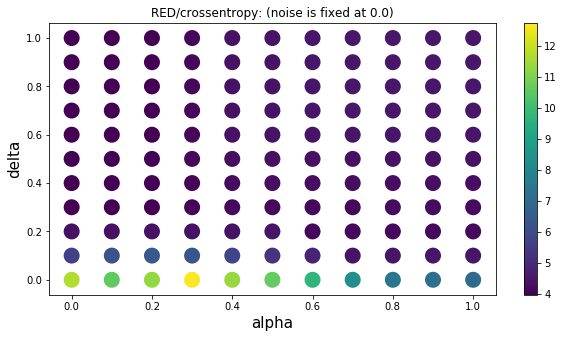

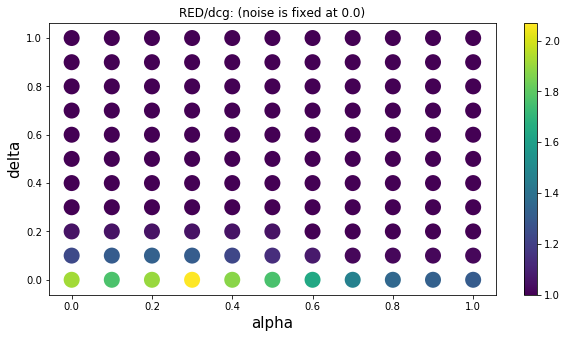

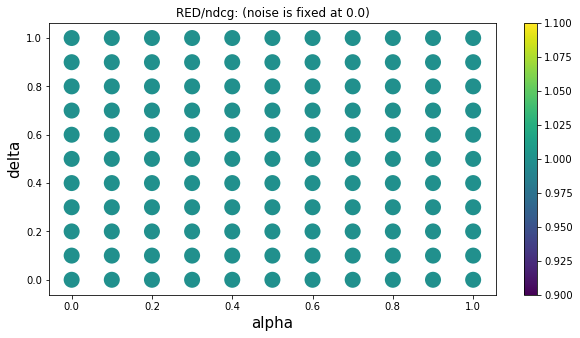

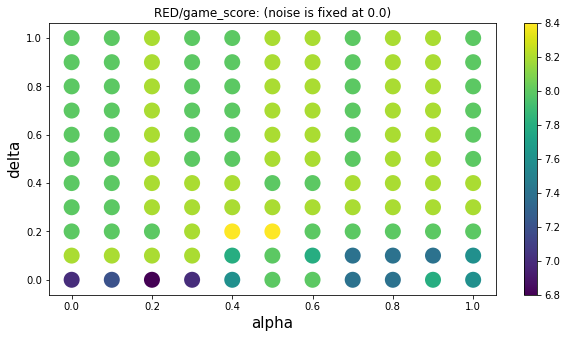

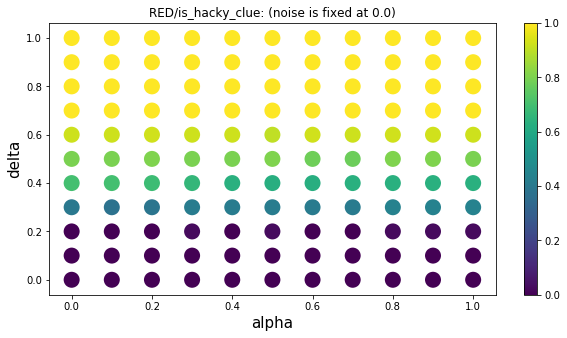

In [95]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="alpha", y_axis="delta", fix_other=0.0, savefig=False, basedir='')

# x: alpha, y:delta, (noise=0.4)

x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.4


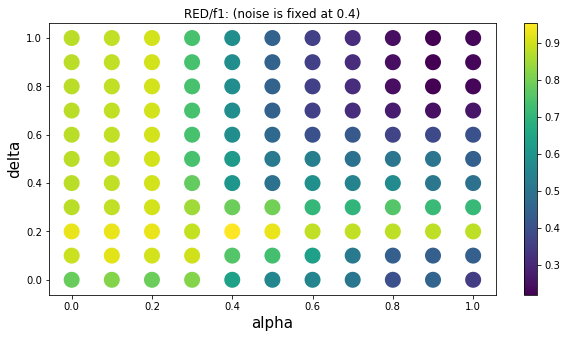

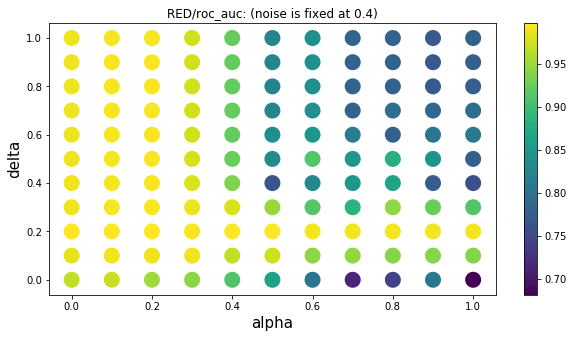

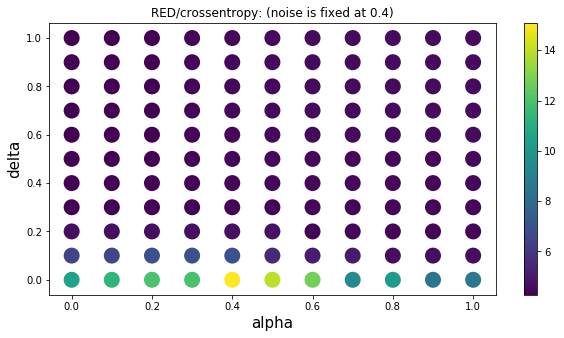

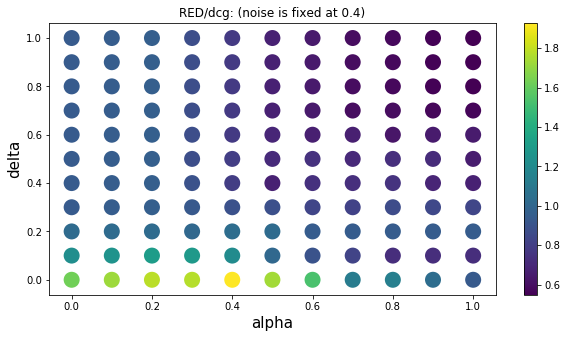

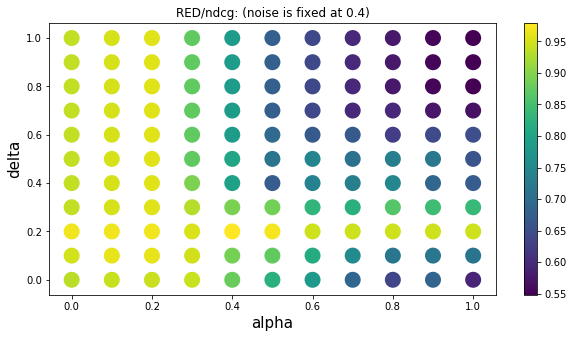

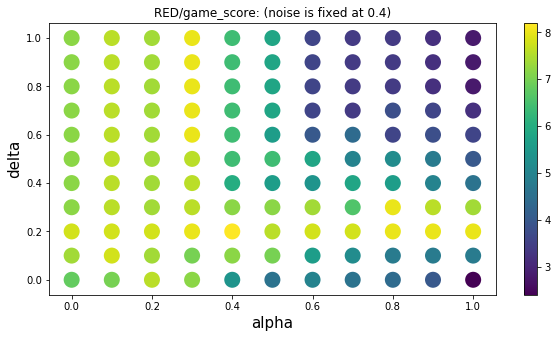

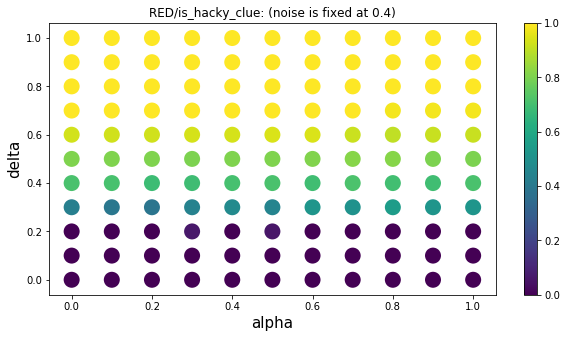

In [97]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="alpha", y_axis="delta", fix_other=0.4, savefig=False, basedir='')

# x: alpha, y:delta, (noise=0.8)

x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.8


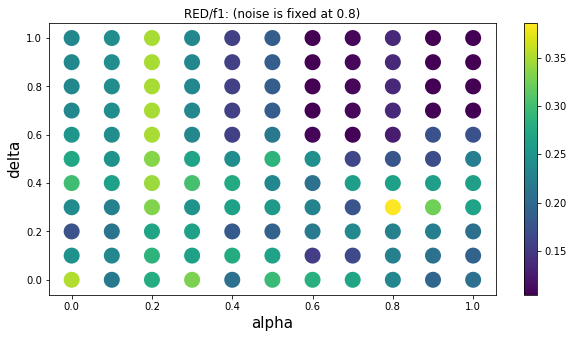

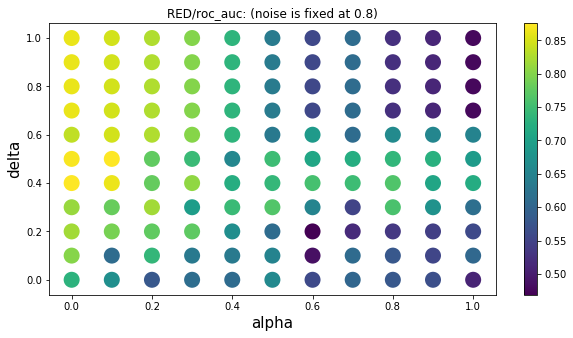

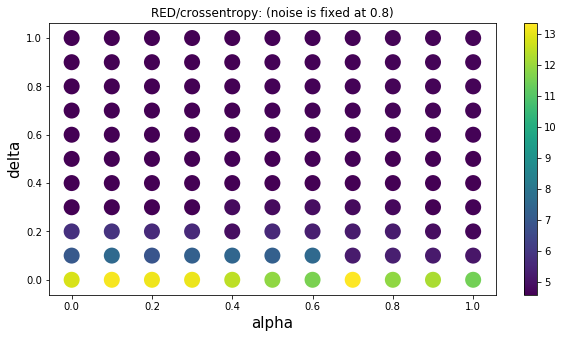

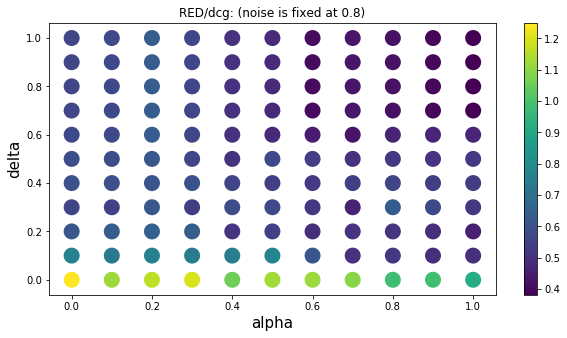

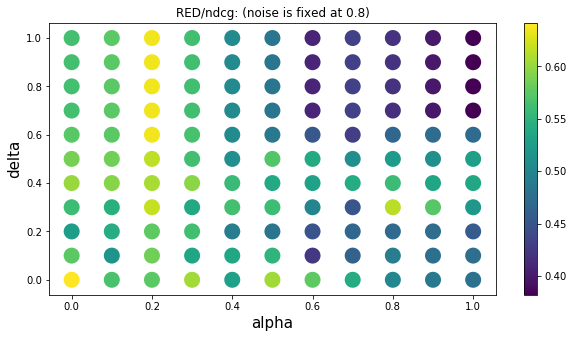

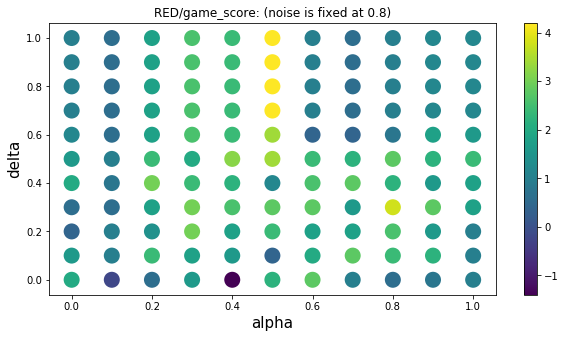

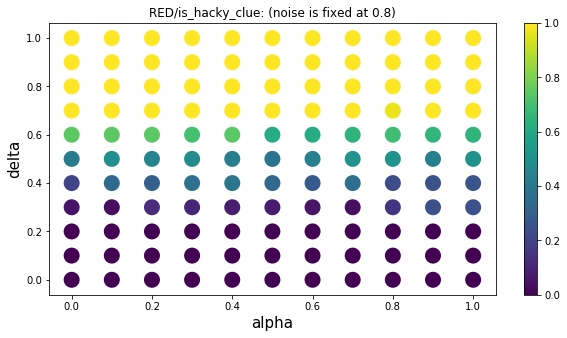

In [99]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="alpha", y_axis="delta", fix_other=0.8, savefig=False, basedir='')

# x: noise, y:delta (alpha=0.0)

x_axis:  noise
y_axis:  delta
excluded axis:  alpha fixed at:  0.0


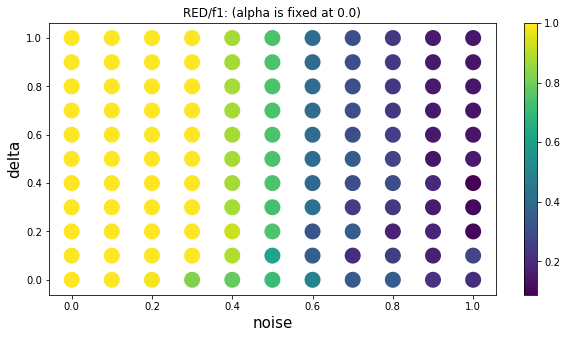

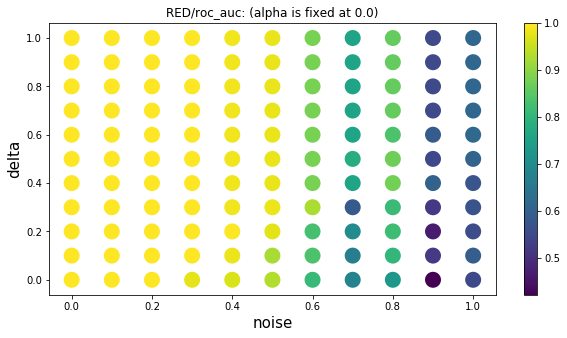

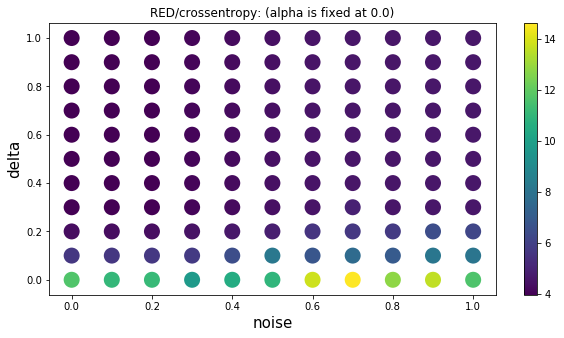

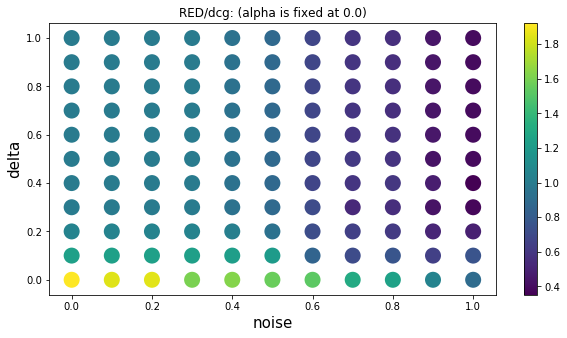

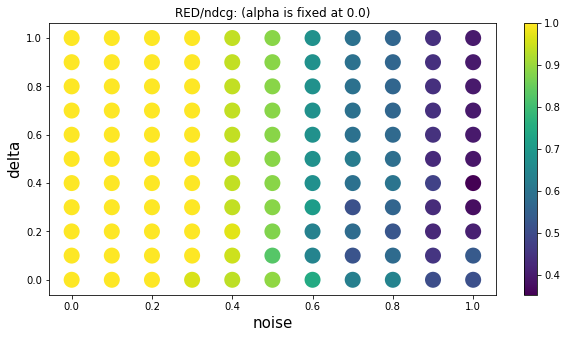

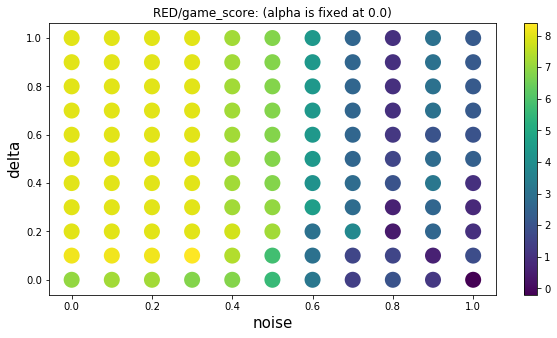

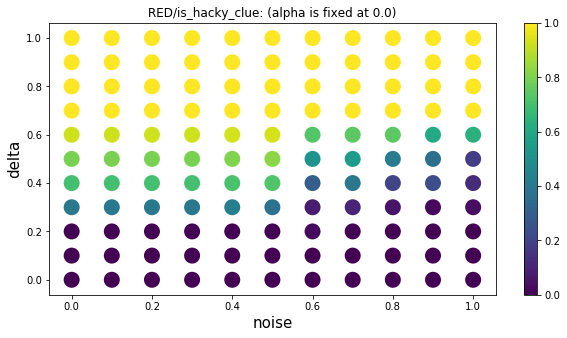

In [100]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="noise", y_axis="delta", fix_other=0.0, savefig=False, basedir='')

# x: noise, y:delta (alpha=0.4)

x_axis:  noise
y_axis:  delta
excluded axis:  alpha fixed at:  0.4


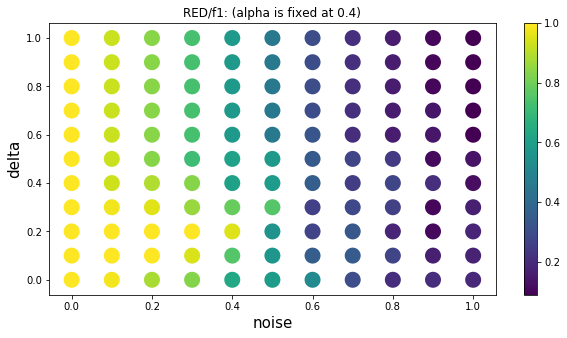

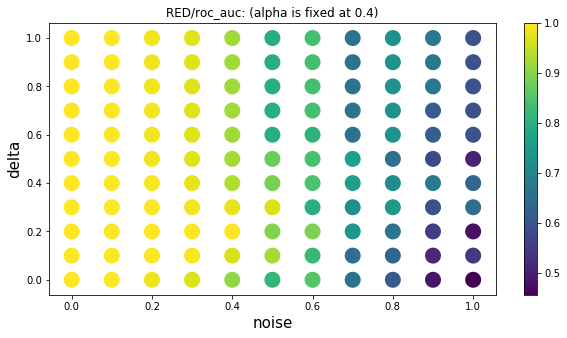

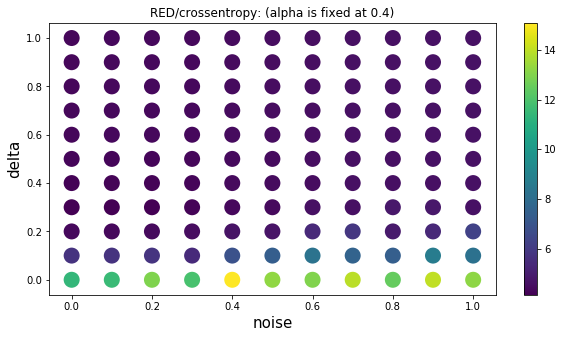

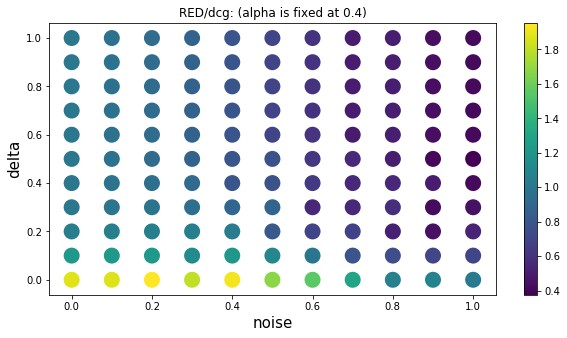

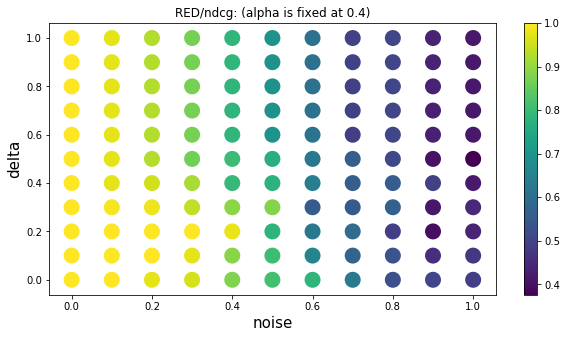

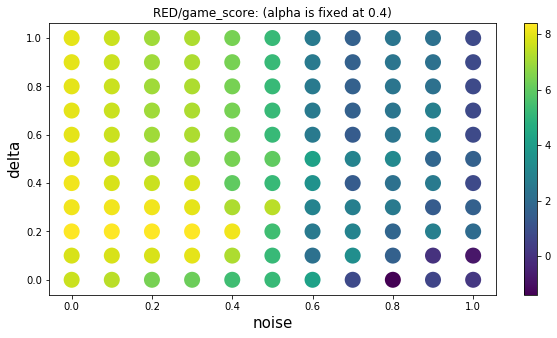

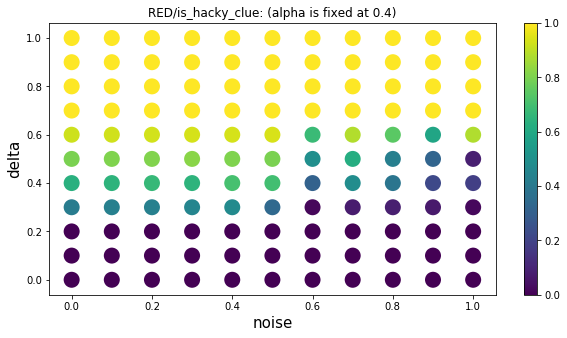

In [102]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="noise", y_axis="delta", fix_other=0.4, savefig=False, basedir='')

# x: noise, y:delta (alpha=0.8)

x_axis:  noise
y_axis:  delta
excluded axis:  alpha fixed at:  0.8


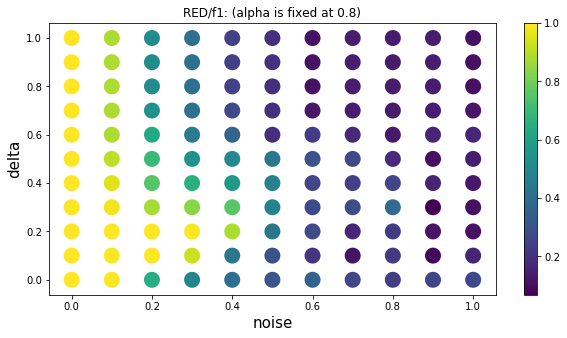

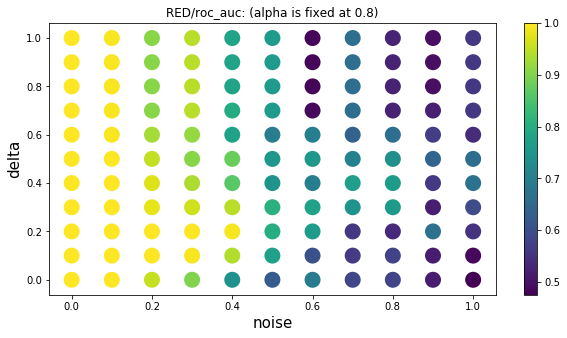

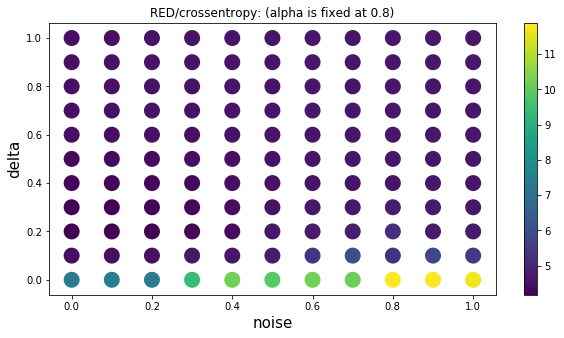

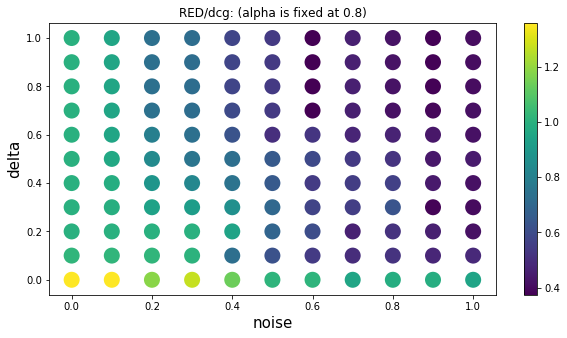

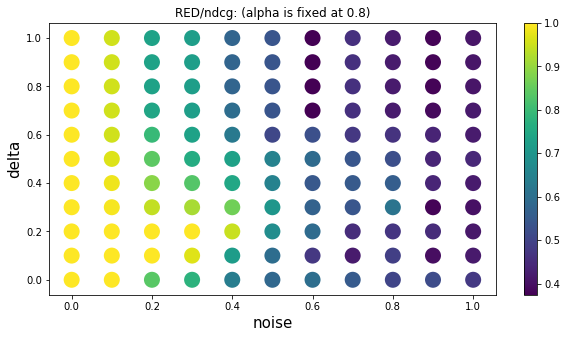

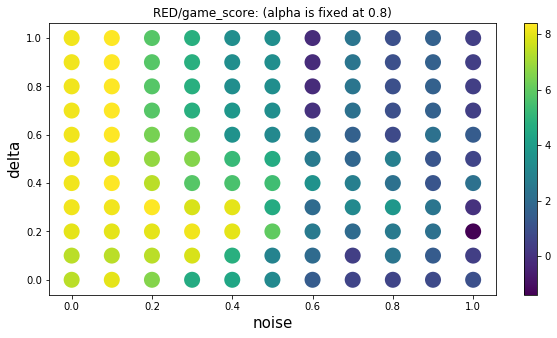

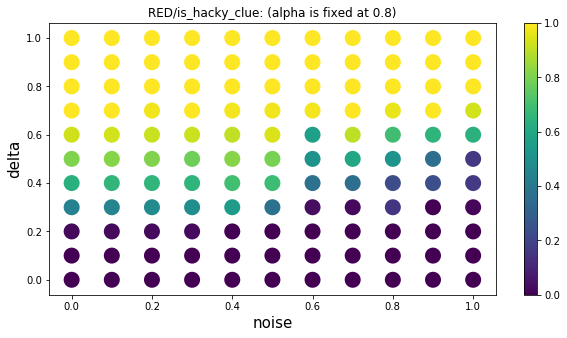

In [103]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="noise", y_axis="delta", fix_other=0.8, savefig=False, basedir='')

# x: noise, y:alpha (delta=0.0)

x_axis:  noise
y_axis:  alpha
excluded axis:  delta fixed at:  0.0


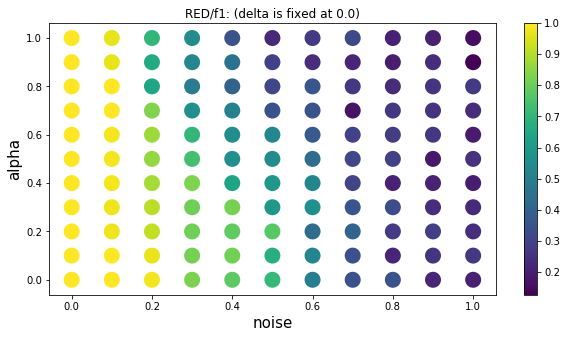

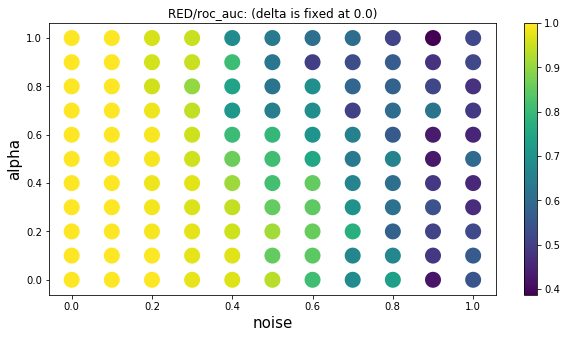

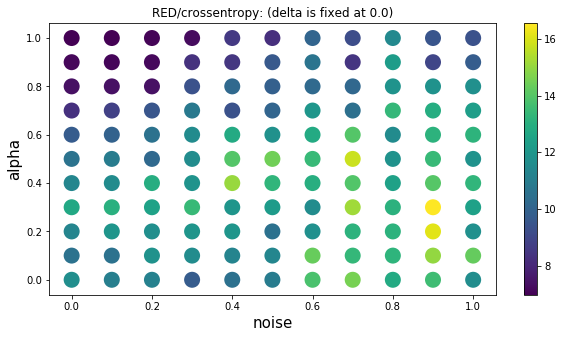

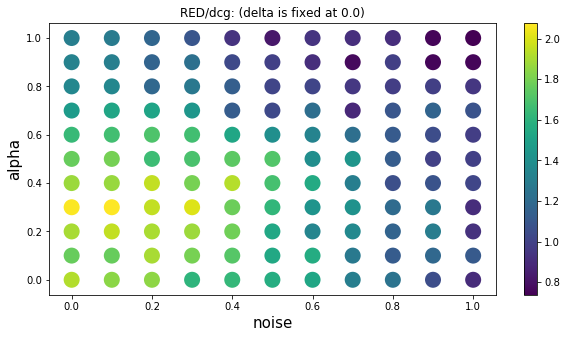

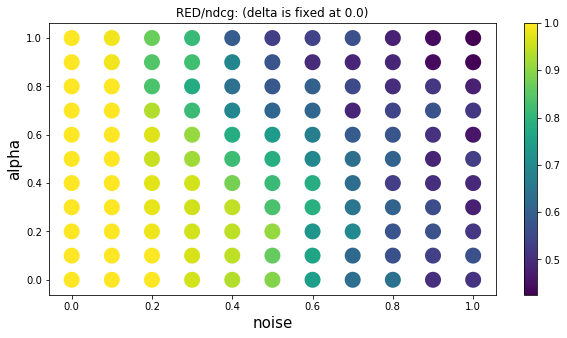

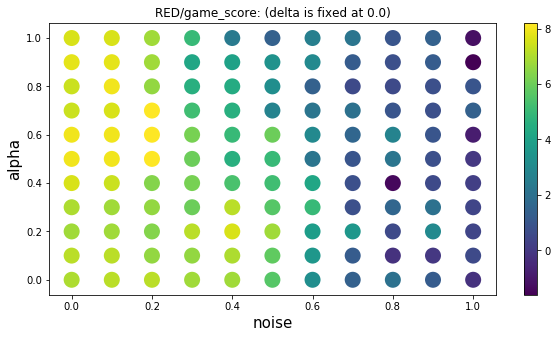

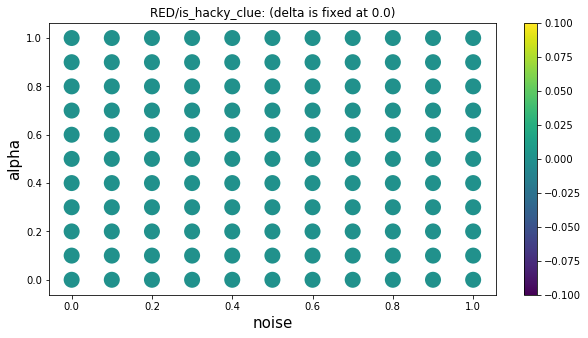

In [104]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="noise", y_axis="alpha", fix_other=0.0, savefig=False, basedir='')

# x: noise, y:alpha (delta=0.4)

x_axis:  noise
y_axis:  alpha
excluded axis:  delta fixed at:  0.4


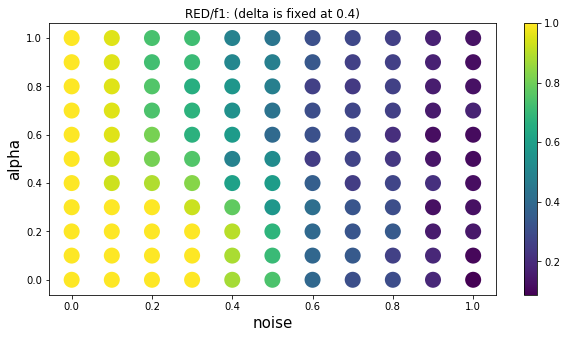

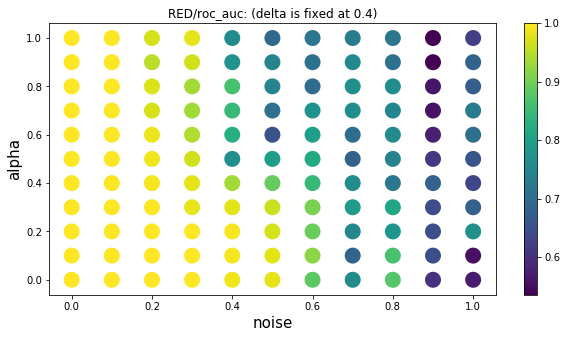

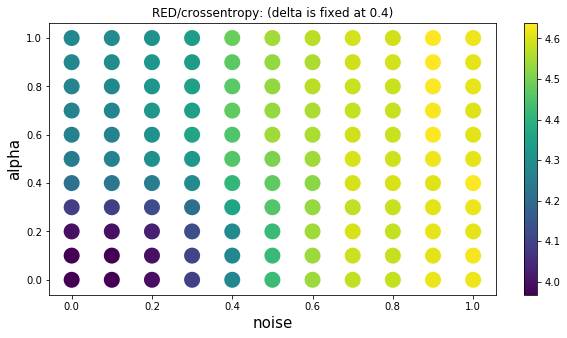

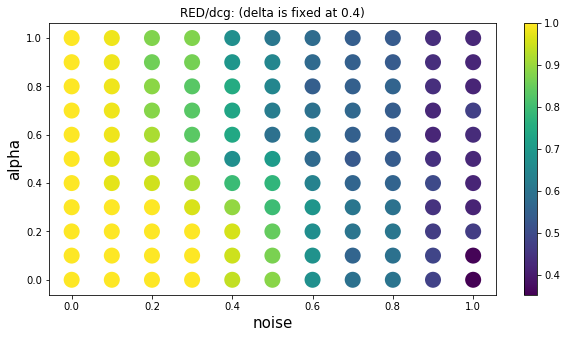

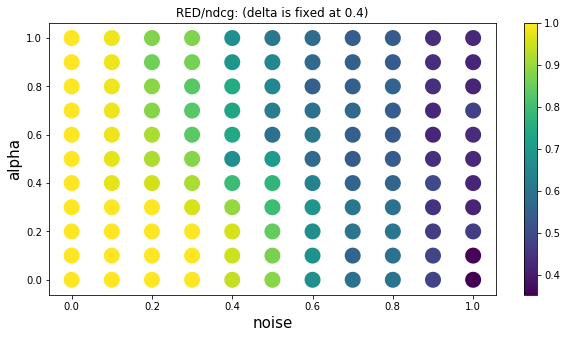

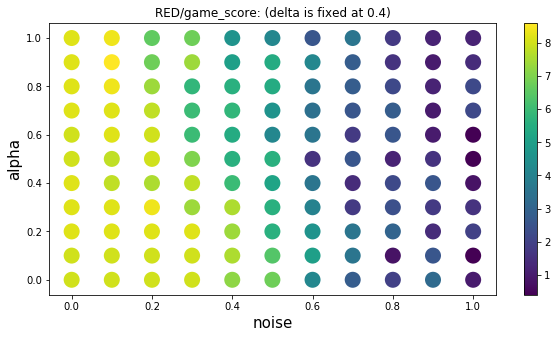

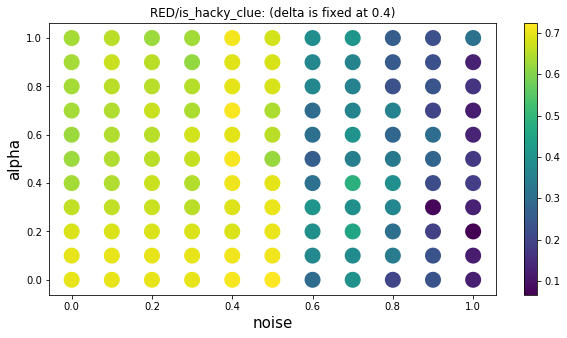

In [105]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="noise", y_axis="alpha", fix_other=0.4, savefig=False, basedir='')

# x: noise, y:alpha (delta=0.8)

x_axis:  noise
y_axis:  alpha
excluded axis:  delta fixed at:  0.8


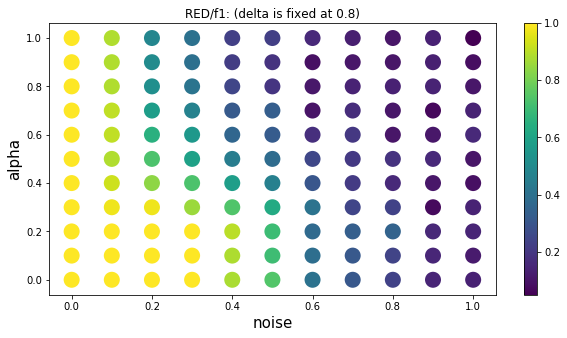

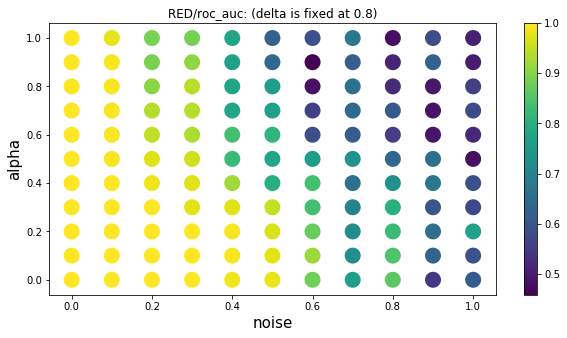

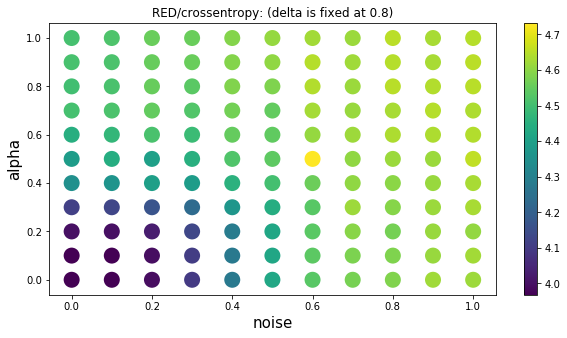

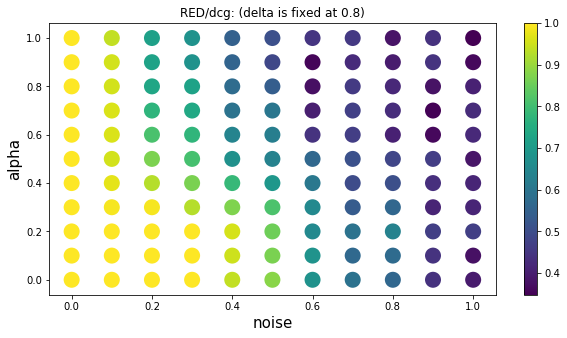

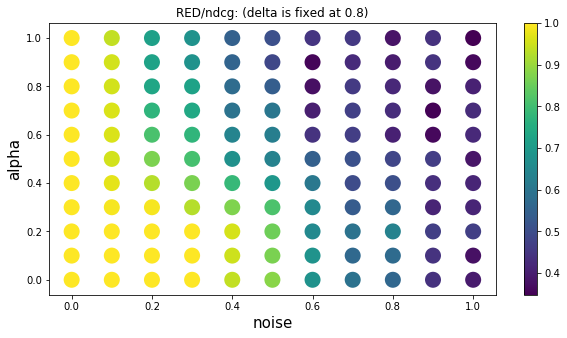

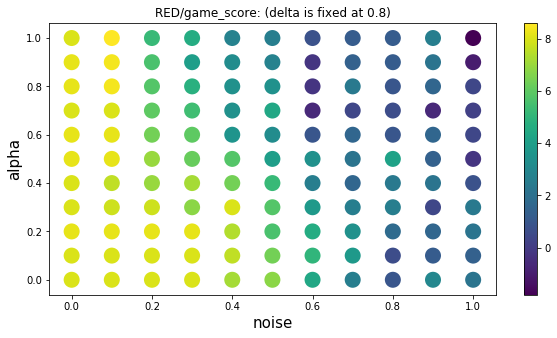

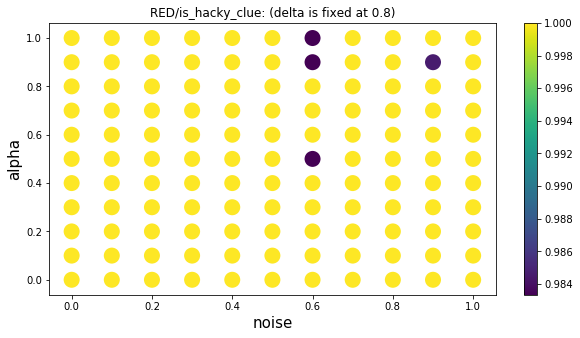

In [106]:
plot_one_team_metric_for_two_hparam("RED", jsonpath=non_normalized_alpha, x_axis="noise", y_axis="alpha", fix_other=0.8, savefig=False, basedir='')

# save images

x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.1
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.2


/Users/tong/.pyenv/versions/anaconda3-4.3.1/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.3
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.4
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.5
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.6
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.7
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.8
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.9
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  1.0
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.1
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.2
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.3
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.4
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0.5
x_axis:  alpha
y_axis:  delta
excluded axis:  noise fixed at:  0

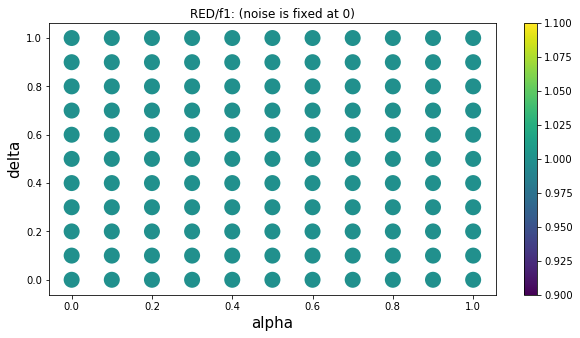

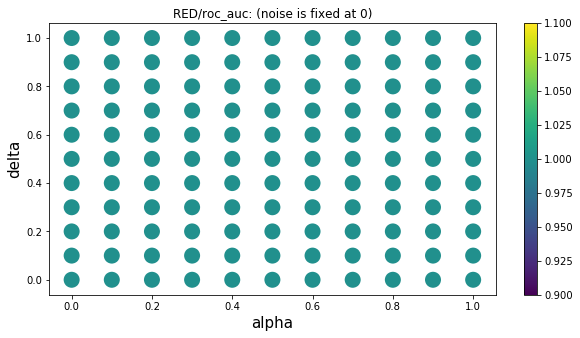

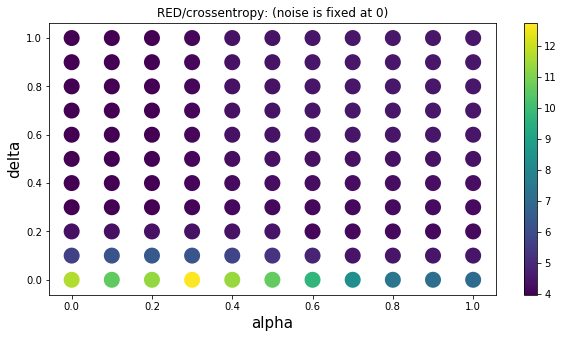

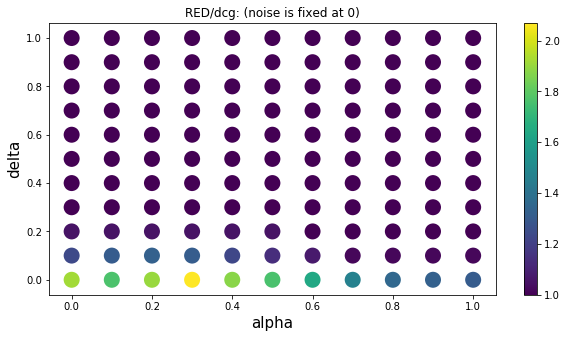

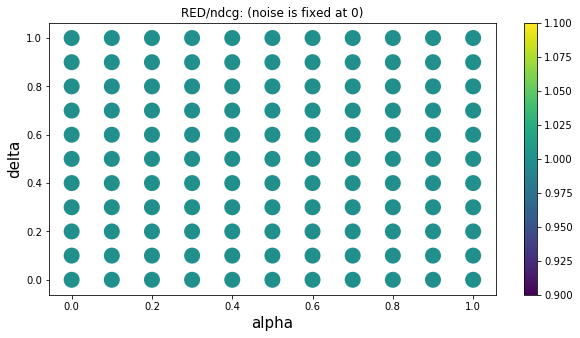

...

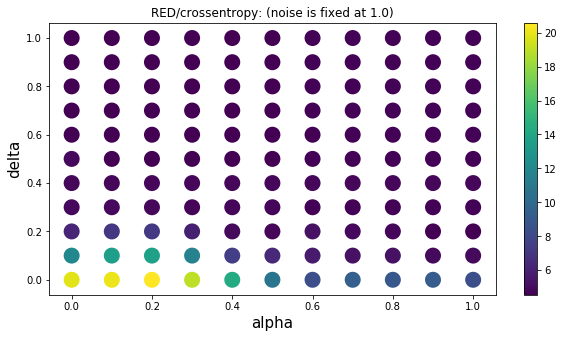

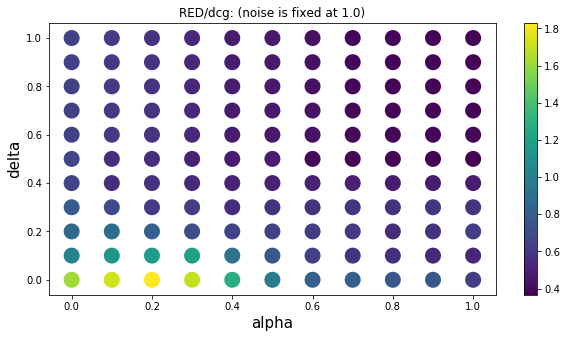

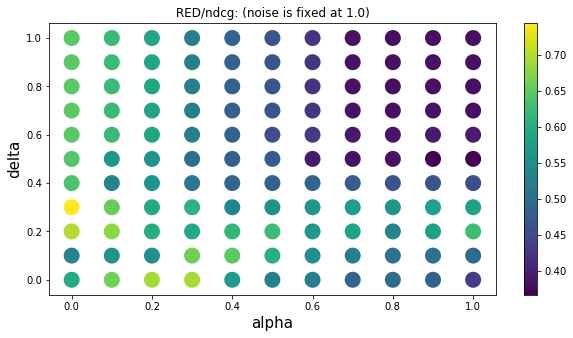

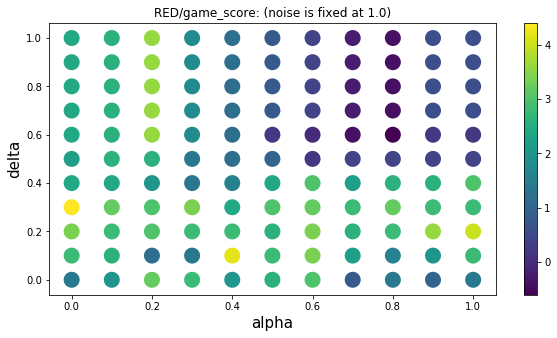

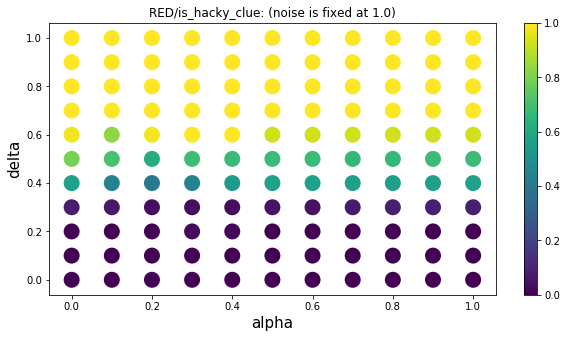

In [93]:
target_jsons = [non_normalized_alpha, normalized_alpha, glove_non_normalized_alpha, glove_normalized_alpha]
target_dirs = [base_non, base, base_glove_non, base_glove]
for target_json, basedir in zip(target_jsons, target_dirs):
    for rate in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
        plot_one_team_metric_for_two_hparam("RED", jsonpath=target_json, x_axis="alpha", y_axis="delta", fix_other=rate, savefig=True, basedir=basedir)